In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 20.9 MB/s eta 0:00:0000:01


In [2]:
from ultralytics import YOLO
from IPython.display import Image,display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from ultralytics import YOLO

# Load a pre-trained YOLO model (you can choose n, s, m, l, or x versions)
model = YOLO("yolo11x.pt")

100%|██████████| 109M/109M [00:00<00:00, 302MB/s] 


In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="oGoCvjxBuj08jQSCGrDi")
project = rf.workspace("all-mix").project("visually-impaired-dataset")
version = project.version(2)
dataset = version.download("yolov11")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 3.4 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Visually-impaired-dataset-2 in yolov11:: 100%|██████████| 6662/6662 [00:00<00:00, 7121.75it/s]


In [5]:
!yolo task=detect mode=train model="/kaggle/working/yolo11x.pt" data="/kaggle/working/Visually-impaired-dataset-2/data.yaml" epochs=15 imgsz=640 batch=32 plots=True freeze=10

Ultralytics 8.3.35 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/working/yolo11x.pt, data=/kaggle/working/Visually-impaired-dataset-2/data.yaml, epochs=15, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fals

In [6]:
!yolo detect val model='/kaggle/working/runs/detect/train/weights/best.pt' data='/kaggle/working/Visually-impaired-dataset-2/data.yaml'

Ultralytics 8.3.35 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11x summary (fused): 464 layers, 56,861,674 parameters, 0 gradients, 194.6 GFLOPs
val: Scanning /kaggle/working/Visually-impaired-dataset-2/valid/labels.cache... 
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 45, len(boxes) = 1258. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        515       1258      0.536      0.535      0.562      0.366
          Dog ahead at          3          3       0.67          1      0.995      0.497
         Door ahead at          3          3      0.838      0.333      0.561       0.36
        Table ahead at          2          2      0.154      0.154      0.497      0.224
         auto ahead at         88   

In [9]:
import json
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch

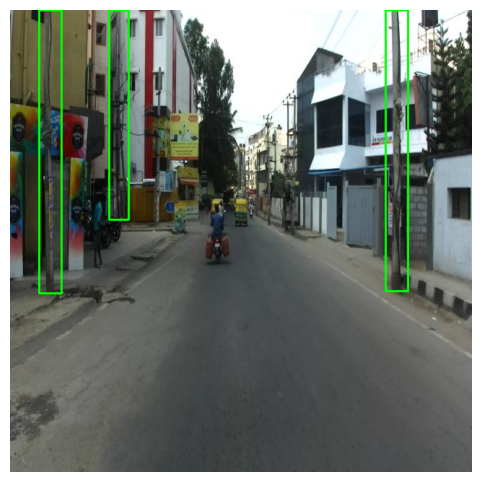

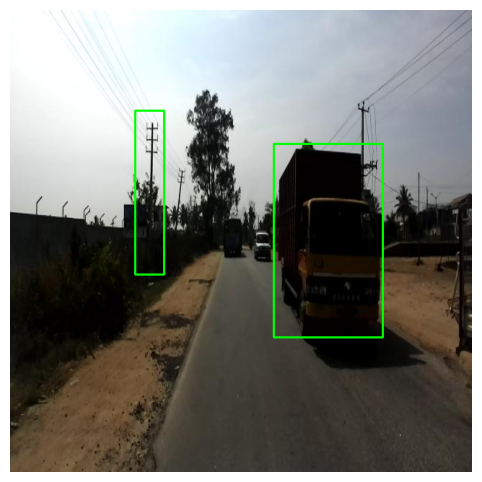

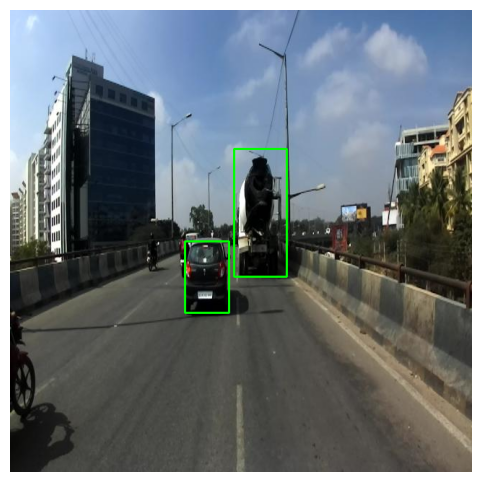

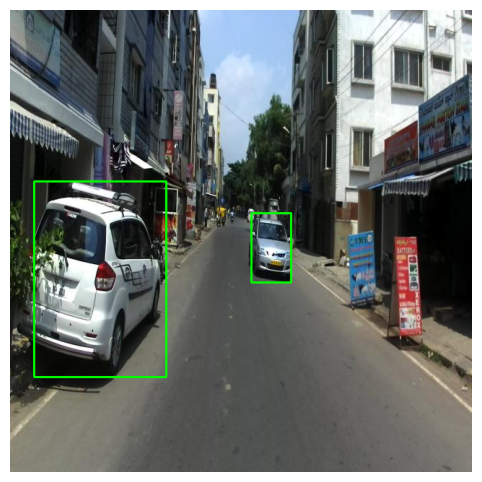

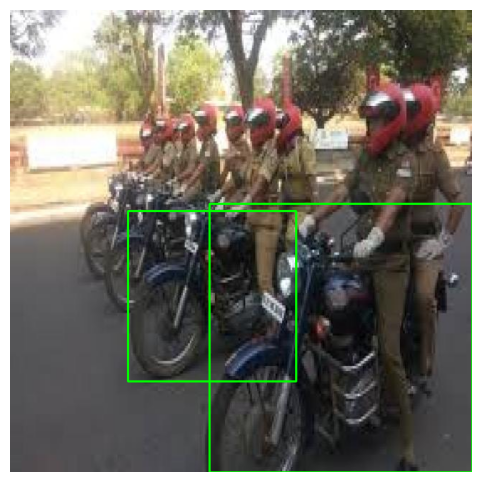

...

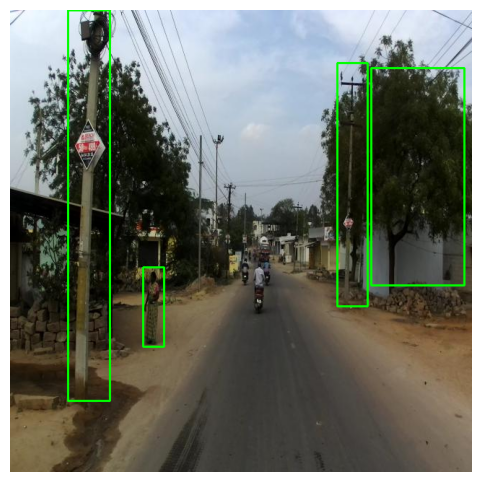

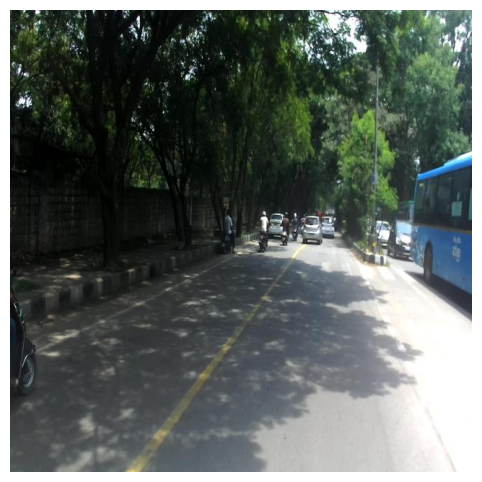

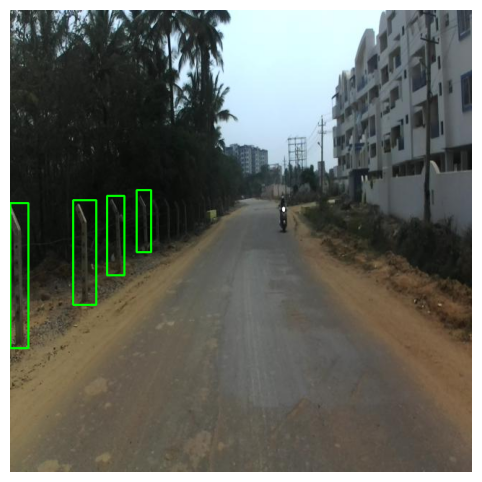

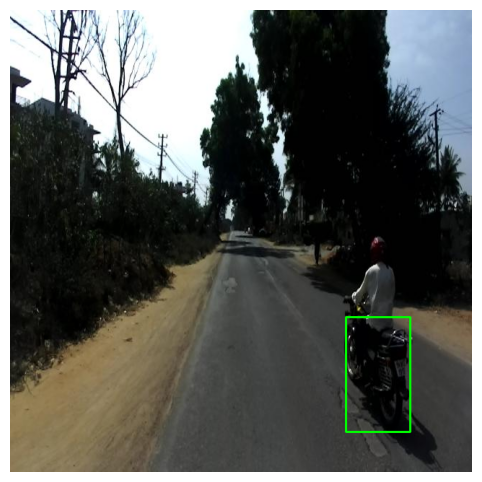

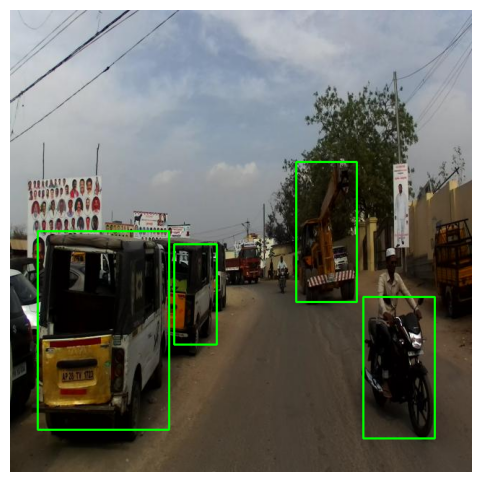

In [11]:
import os
import cv2
import matplotlib.pyplot as plt

class_names = {
    'Dog ahead at', 'Door ahead at', 'Table ahead at', 'auto ahead at', 'barrier ahead at', 'bench ahead at', 'bicycle ahead at', 'bus ahead at', 'car ahead at', 'cattle ahead at', 'chair ahead at', 'dustbin ahead at', 'electric pole ahead at', 'footpath on', 'fridge ahead at', 'gate ahead at', 'motorcycle ahead at', 'pathole ahead at', 'person ahead at', 'pillar ahead at', 'plant ahead at', 'sign board ahead at', 'stairs ahead at', 'step ahead at', 'stones ahead at', 'traffic signal ahead at', 'tree ahead at', 'truck ahead at', 'wash basin ahead at', 'zebra crossing ahead at',
}

images = os.listdir('/kaggle/working/Visually-impaired-dataset-2/train/images')

for image_path in images[10:25]:
    image_full_path = os.path.join('/kaggle/working/Visually-impaired-dataset-2/train/images', image_path)
    image = cv2.imread(image_full_path)

    label_path = os.path.join('/kaggle/working/Visually-impaired-dataset-2/train/labels', f"{os.path.splitext(image_path)[0]}.txt")
    try:
        with open(label_path, "r") as file:
            lines = file.readlines()
        bboxes = []

        for line in lines:
            values = line.strip().split()

            if len(values) == 5:
                class_id, x_center, y_center, width, height = map(float, values)
            else:
                # Handle lines with more values
                class_id = float(values[0])
                x_coords = [float(values[i]) for i in range(1, len(values), 2)]
                y_coords = [float(values[i + 1]) for i in range(1, len(values), 2)]
                x_min, y_min = min(x_coords), min(y_coords)
                x_max, y_max = max(x_coords), max(y_coords)
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                width = x_max - x_min
                height = y_max - y_min

            # Store bbox in the expected format
            bboxes.append([class_id, x_center, y_center, width, height])

    except FileNotFoundError:
        print(f"Label not found for {image_path}")
        continue

    for bbox in bboxes:
        class_id, x_center, y_center, width, height = bbox
        image_height, image_width, _ = image.shape
        x_min = int((x_center - width / 2) * image_width)
        y_min = int((y_center - height / 2) * image_height)
        box_width = int(width * image_width)
        box_height = int(height * image_height)
        color = (0, 255, 0)

        cv2.rectangle(image, (x_min, y_min), (x_min + box_width, y_min + box_height), color, 2)

        if class_id in class_names:
            class_name = class_names[class_id]
            label = f"{class_name}"
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 1
            font_thickness = 2
            cv2.putText(image, label, (x_min, y_min - 10), font, font_scale, color, font_thickness)

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()



image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/866602_leftImg8bit_png.rf.8708cef5928e1da46185b5c8d6b81589.jpg: 640x640 3 electric pole ahead ats, 1 person ahead at, 39.7ms
Speed: 4.4ms preprocess, 39.7ms inference, 123.6ms postprocess per image at shape (1, 3, 640, 640)


Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)


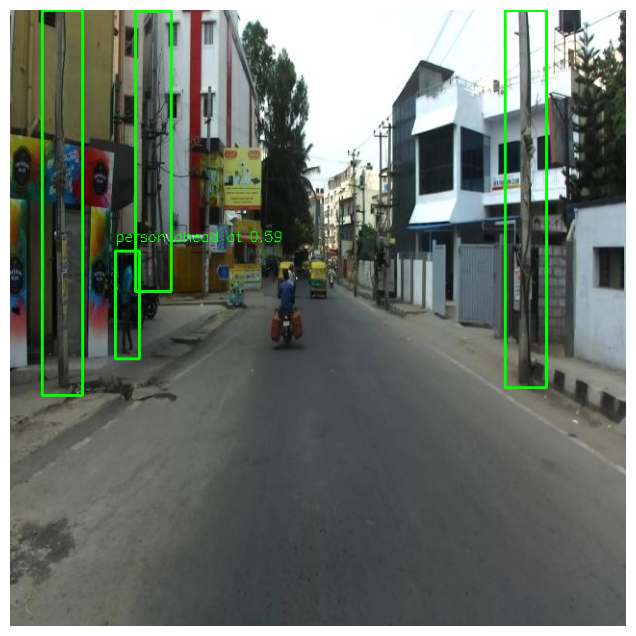


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/015926_leftImg8bit_png.rf.99a77705e8f7edab77e7a990d657ec61.jpg: 640x640 1 electric pole ahead at, 1 truck ahead at, 40.1ms
Speed: 1.6ms preprocess, 40.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


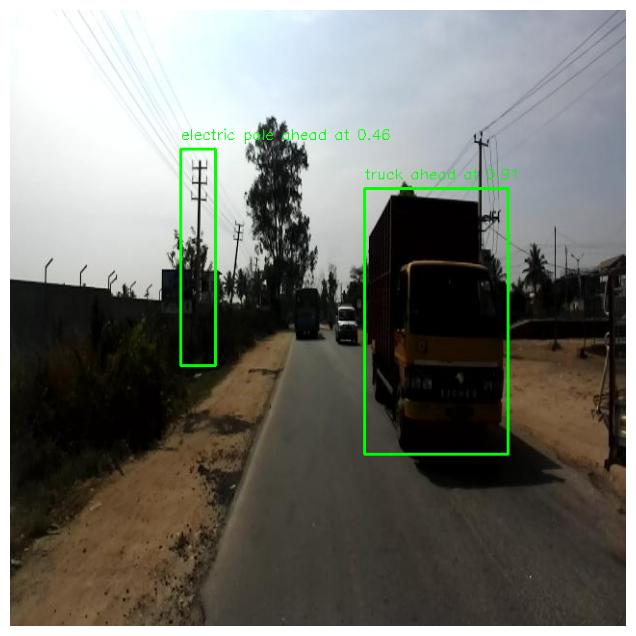


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/007734_leftImg8bit_png.rf.9f1eb5dd25c6c5bc62028bdf0167d049.jpg: 640x640 1 car ahead at, 1 motorcycle ahead at, 1 truck ahead at, 40.0ms
Speed: 2.2ms preprocess, 40.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


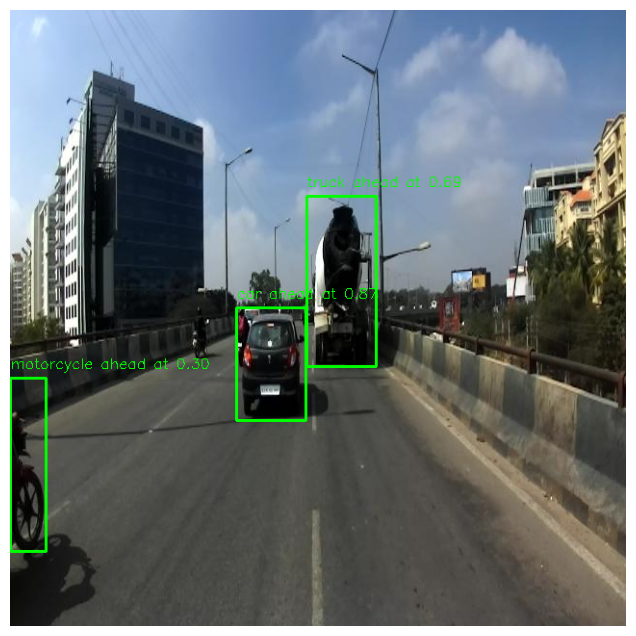


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/884927_leftImg8bit_png.rf.547610012a39590d377c1aa82a06b43f.jpg: 640x640 2 car ahead ats, 40.0ms
Speed: 2.2ms preprocess, 40.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


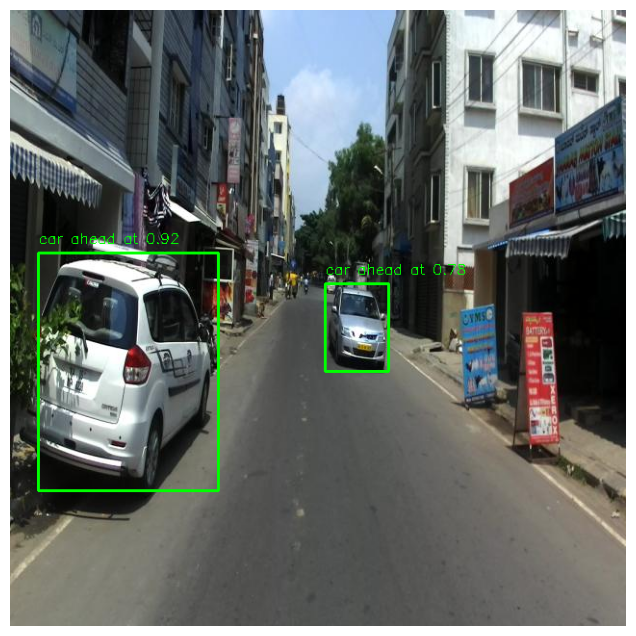


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/images-7-_jpg.rf.cbc788c8421218270f90900244bd42cd.jpg: 640x640 (no detections), 40.1ms
Speed: 2.2ms preprocess, 40.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


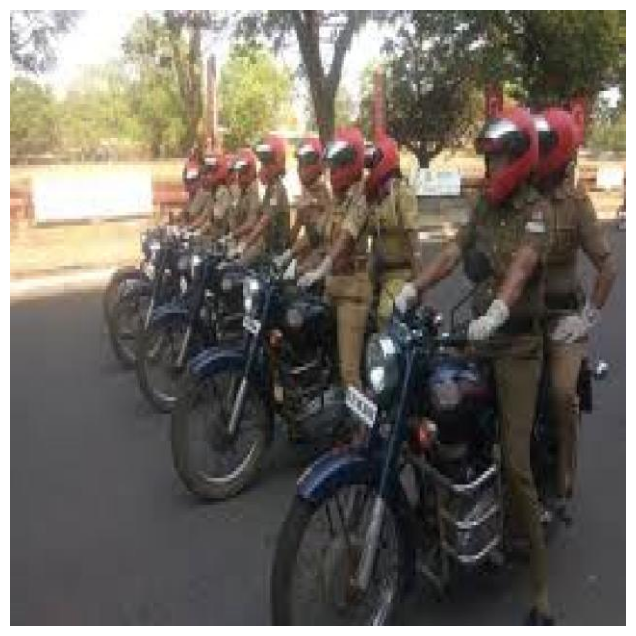


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/131886_leftImg8bit_png.rf.d06f92f8c8cc2288f195a86b477b4191.jpg: 640x640 3 truck ahead ats, 40.1ms
Speed: 2.2ms preprocess, 40.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


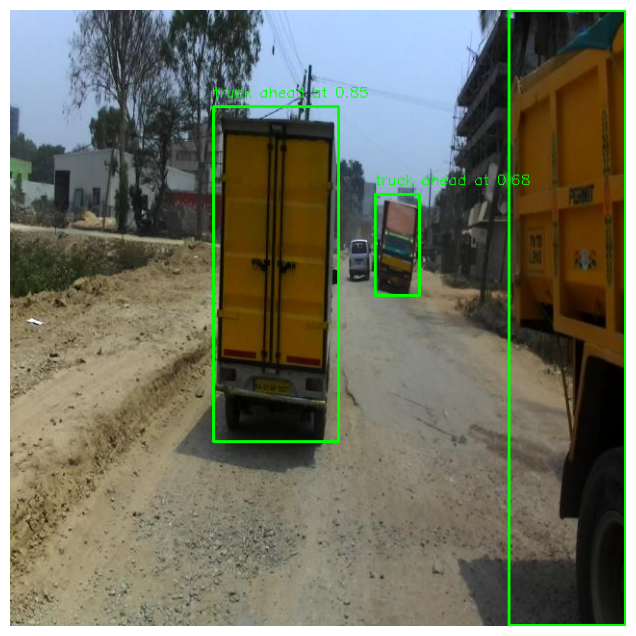


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/773124_leftImg8bit_png.rf.c7e54b811a0cc89b0d198660a0908d10.jpg: 640x640 1 electric pole ahead at, 3 tree ahead ats, 39.8ms
Speed: 1.6ms preprocess, 39.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


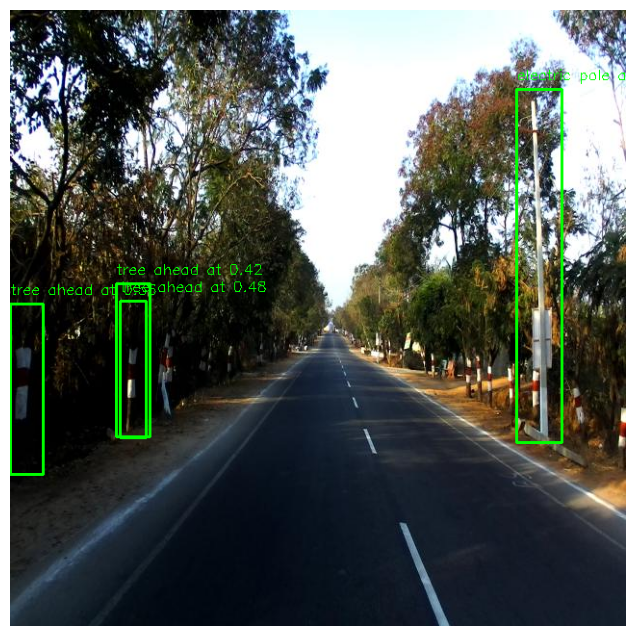


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/130_png.rf.3e24d9d10270021ff6a836c914deca9b.jpg: 640x640 (no detections), 40.0ms
Speed: 1.7ms preprocess, 40.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


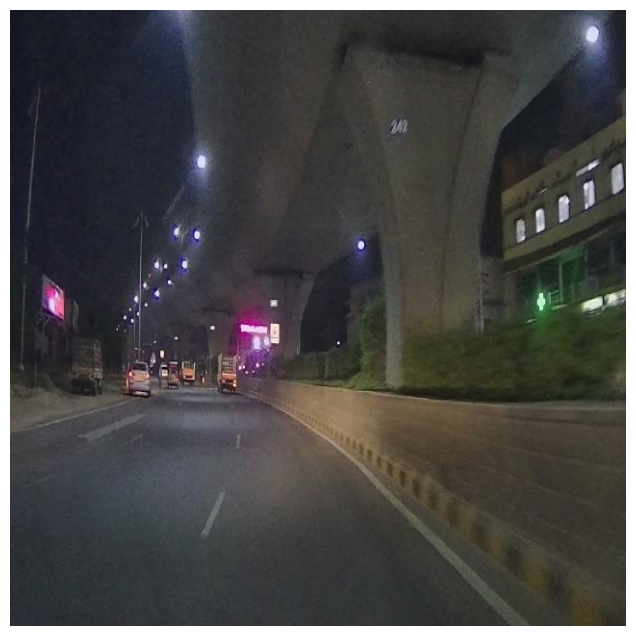


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/403816_leftImg8bit_png.rf.742227262b657173c588217369d226f3.jpg: 640x640 1 auto ahead at, 2 car ahead ats, 39.6ms
Speed: 1.6ms preprocess, 39.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


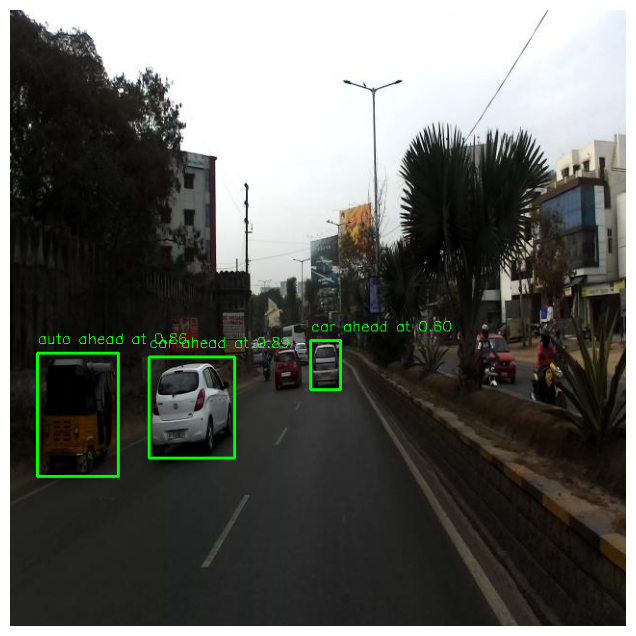


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/021785_leftImg8bit_png.rf.49269aeda47c40e4aaad00b59b0178a2.jpg: 640x640 1 auto ahead at, 1 car ahead at, 1 motorcycle ahead at, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


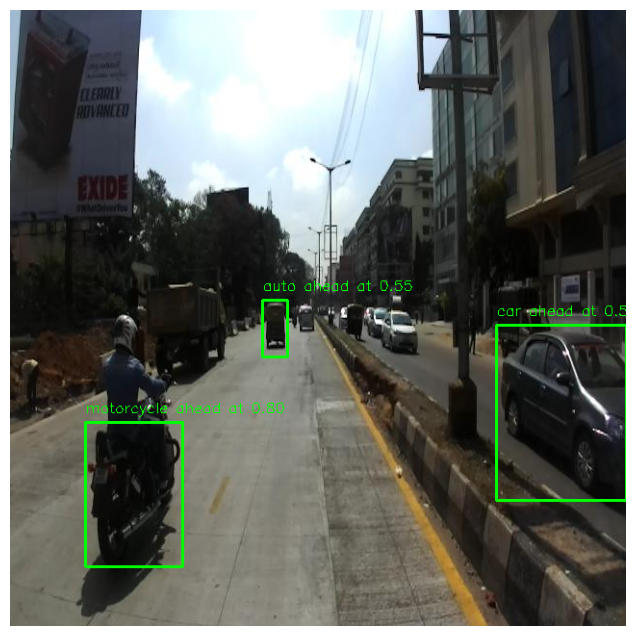


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/632184_leftImg8bit_png.rf.ba478f35a8bc5141dce071d0ef312e10.jpg: 640x640 3 electric pole ahead ats, 1 motorcycle ahead at, 1 person ahead at, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


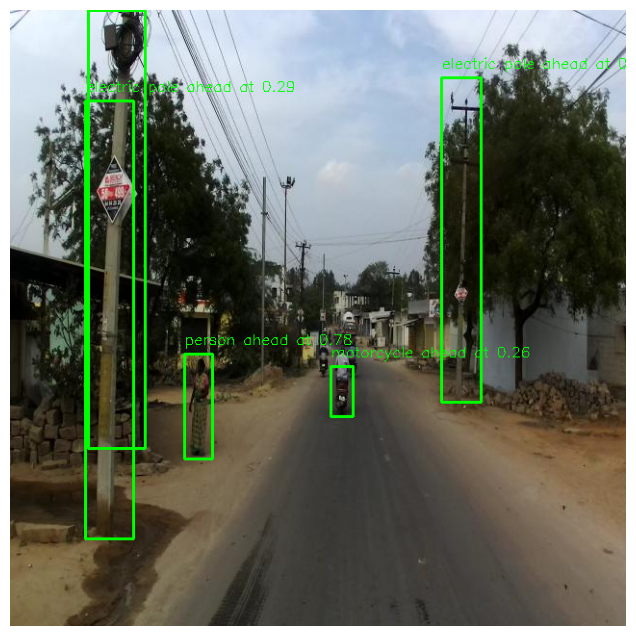


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/255512_leftImg8bit_png.rf.abec8ef7cc995f90872ed26853b93e6f.jpg: 640x640 1 motorcycle ahead at, 1 tree ahead at, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


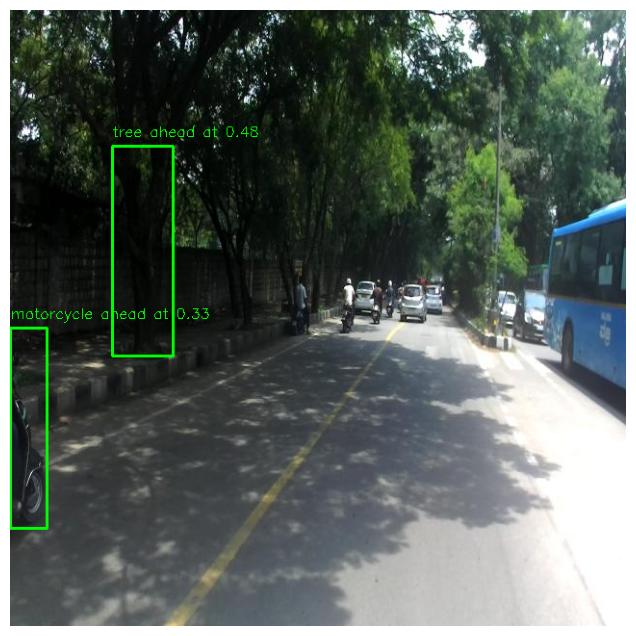


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/208779_leftImg8bit_png.rf.355749b6566e2745f594d15732e7d293.jpg: 640x640 5 barrier ahead ats, 1 electric pole ahead at, 40.0ms
Speed: 1.6ms preprocess, 40.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


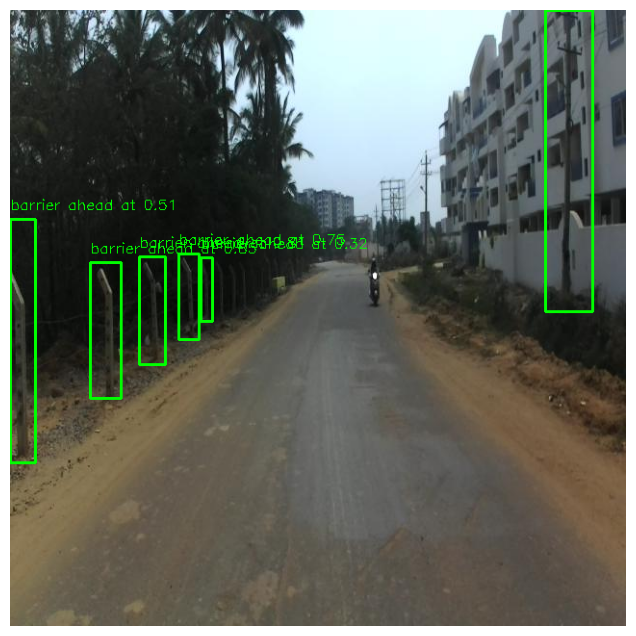


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/021387_leftImg8bit_png.rf.fd4ba5807cea004d8e494e8646ade08b.jpg: 640x640 1 motorcycle ahead at, 39.5ms
Speed: 1.7ms preprocess, 39.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


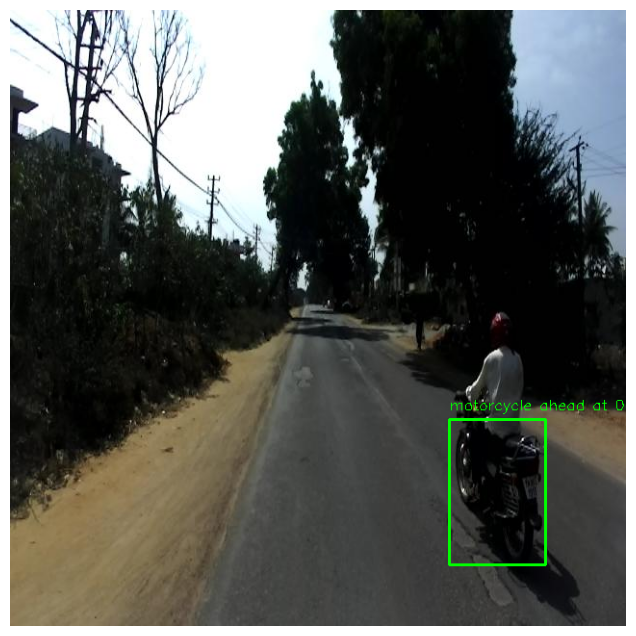


image 1/1 /kaggle/working/Visually-impaired-dataset-2/train/images/841347_leftImg8bit_png.rf.a6c30a674b6949c561abe4cc2b9575eb.jpg: 640x640 2 car ahead ats, 1 motorcycle ahead at, 2 truck ahead ats, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


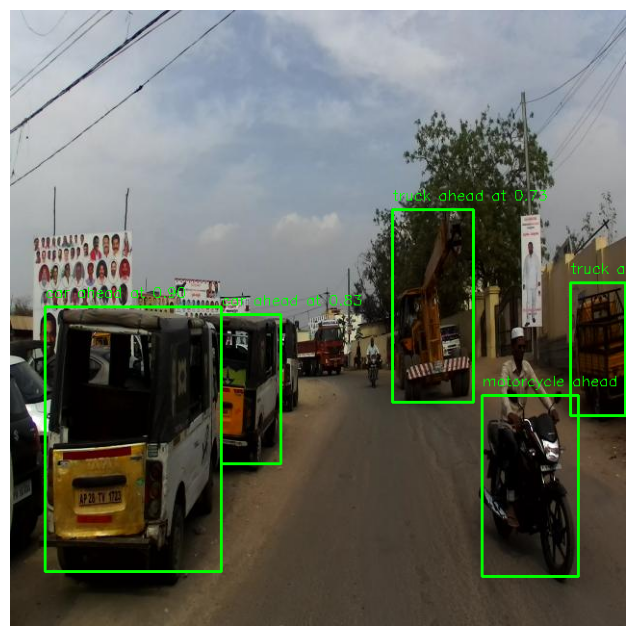

In [12]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load the YOLOv5 model (assuming you have yolov5s.pt weights file)
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Define the class names based on YOLOv5 classes
class_names = model.names

# Define the path to the images directory
images_path = '/kaggle/working/Visually-impaired-dataset-2/train/images'
image_files = os.listdir(images_path)

for image_file in image_files[10:25]:
    image_path = os.path.join(images_path, image_file)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Could not read image {image_path}")
        continue

    # Perform object detection
    results = model(image_path)

    for result in results[0].boxes:  # boxes attribute for bounding boxes
        x_min, y_min, x_max, y_max = result.xyxy[0].cpu().numpy()
        confidence = result.conf.cpu().numpy()
        class_id = result.cls.cpu().numpy()

        x_min = int(x_min)
        y_min = int(y_min)
        x_max = int(x_max)
        y_max = int(y_max)

        color = (0, 255, 0)  # Green color for the bounding boxes
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 2)

        class_name = class_names[int(class_id)]
        label = f"{class_name} {confidence[0]:.2f}"  # Extract the single element from the array
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        font_thickness = 1
        cv2.putText(image, label, (x_min, y_min - 10), font, font_scale, color, font_thickness)

    # Convert BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with bounding boxes using matplotlib
    plt.figure(figsize=(12, 8))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()



0: 640x640 (no detections), 39.6ms
Speed: 1.9ms preprocess, 39.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


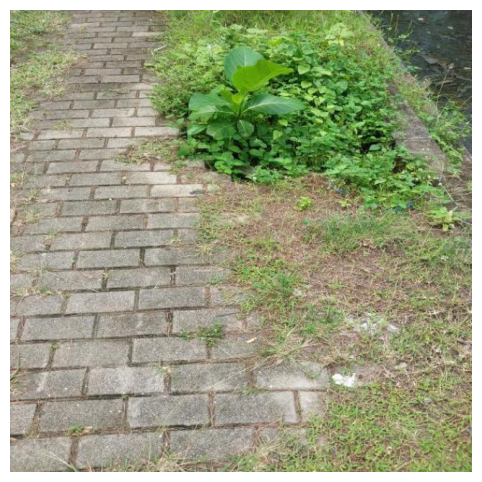


0: 640x640 1 barrier ahead at, 1 car ahead at, 1 motorcycle ahead at, 1 truck ahead at, 35.9ms
Speed: 1.8ms preprocess, 35.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


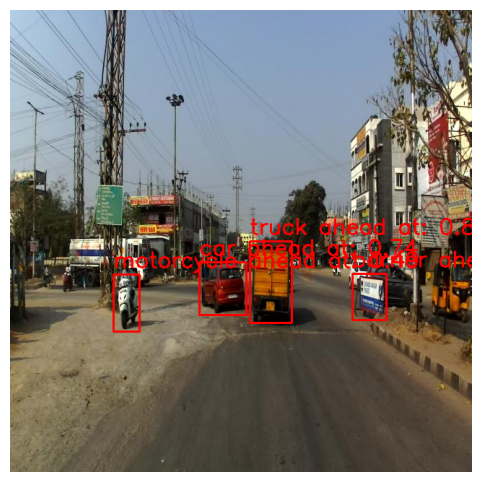


0: 640x640 2 car ahead ats, 1 electric pole ahead at, 36.1ms
Speed: 1.7ms preprocess, 36.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


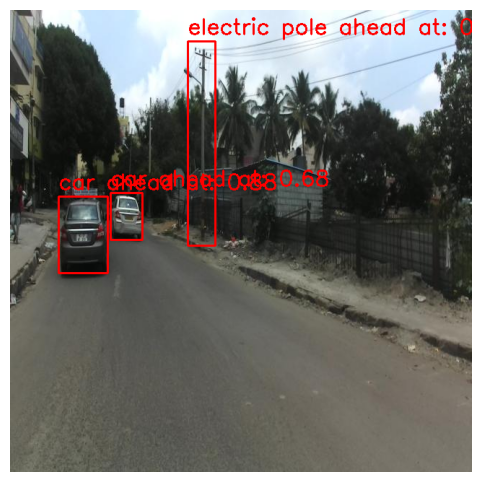


0: 640x640 1 auto ahead at, 1 truck ahead at, 36.0ms
Speed: 1.8ms preprocess, 36.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


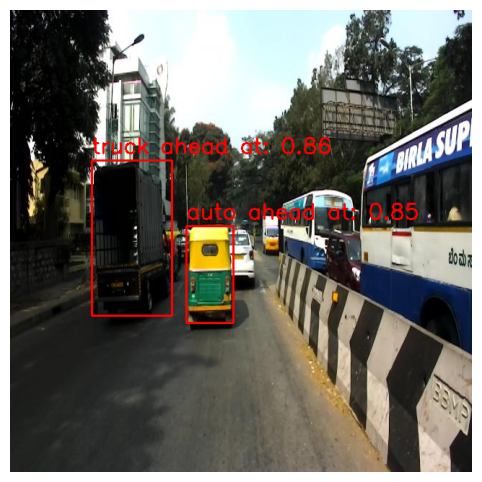


0: 640x640 1 barrier ahead at, 1 car ahead at, 1 sign board ahead at, 35.9ms
Speed: 1.7ms preprocess, 35.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


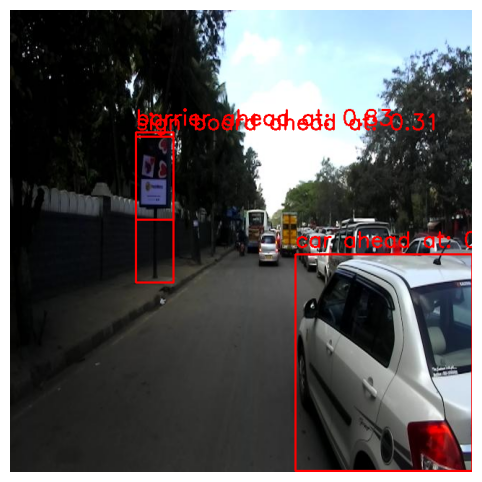


0: 640x640 1 car ahead at, 1 electric pole ahead at, 1 motorcycle ahead at, 2 person ahead ats, 1 truck ahead at, 36.0ms
Speed: 2.1ms preprocess, 36.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


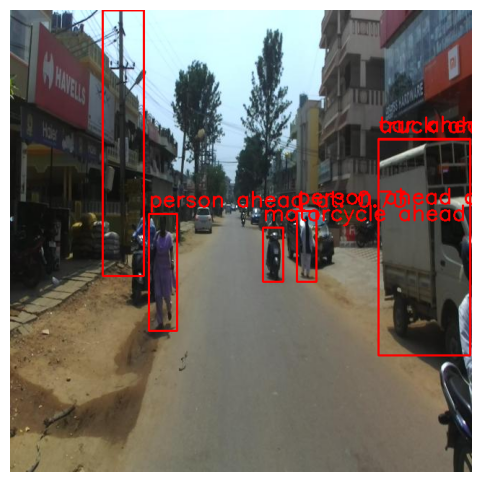

In [14]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Define the path to the test images directory
test_dataset_dir = "/kaggle/working/Visually-impaired-dataset-2/test/images"

# Get the list of images in the test dataset directory
test_images = os.listdir(test_dataset_dir)

# Load the YOLO model
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

# Iterate over the test images at intervals (e.g., every 49 images)
for img_id in range(0, len(test_images), 49):
    # Load the image
    image_path = os.path.join(test_dataset_dir, test_images[img_id])
    image = cv2.imread(image_path)

    if image is None:
        print(f"Could not read image {image_path}")
        continue

    # Perform object detection
    detections = model(image)
    result = detections[0]

    class_ids = result.boxes.cls.cpu().numpy()  # Class IDs
    confidences = result.boxes.conf.cpu().numpy()  # Confidence scores
    bboxes = np.array(result.boxes.xyxy.cpu(), dtype="int")  # Bounding boxes

    for i, bbox in enumerate(bboxes):
        x, y, x2, y2 = bbox
        cv2.rectangle(image, (x, y), (x2, y2), (0, 0, 255), 2)  # Red bounding box

        class_id = int(class_ids[i])
        confidence = float(confidences[i])
        label = f"{model.names[class_id]}: {confidence:.2f}"

        cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Convert BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with bounding boxes using matplotlib
    plt.figure(figsize=(8, 6))
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.show()


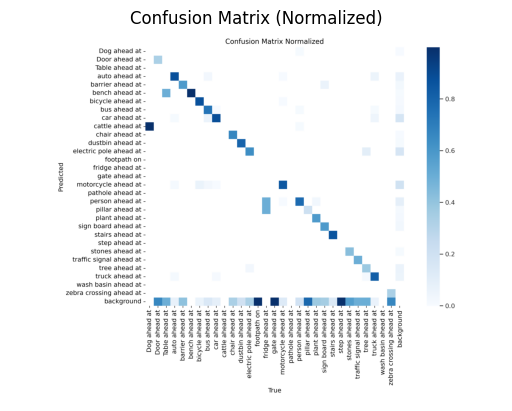

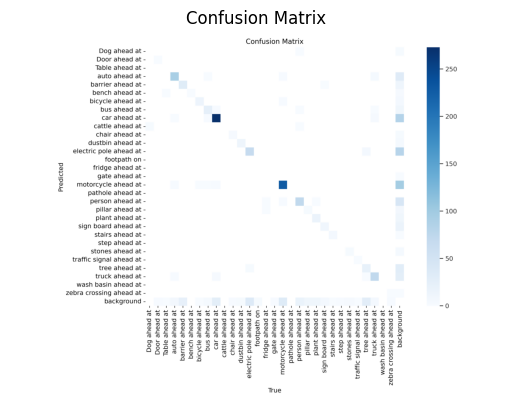

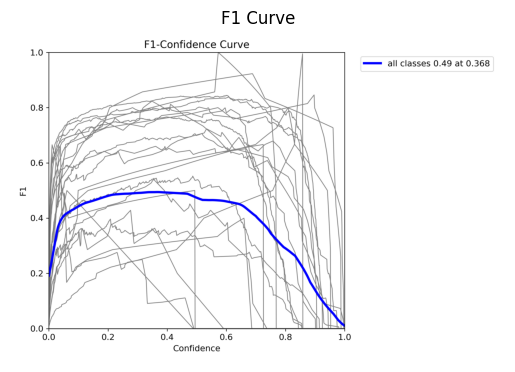

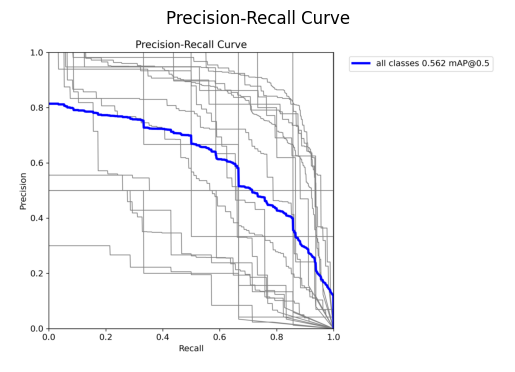

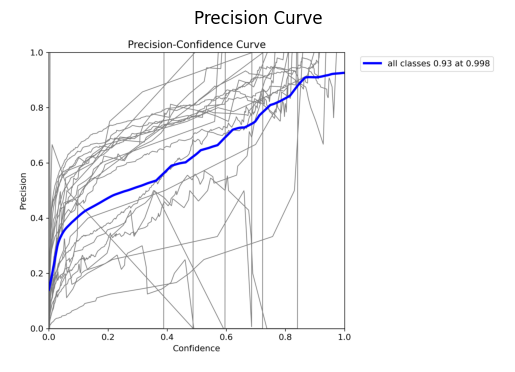

...

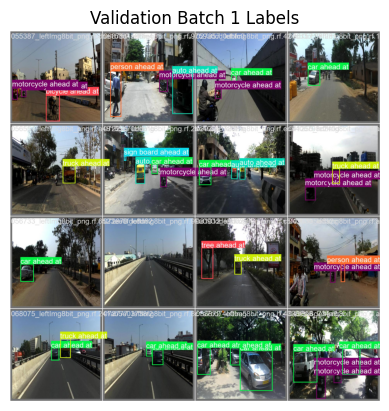

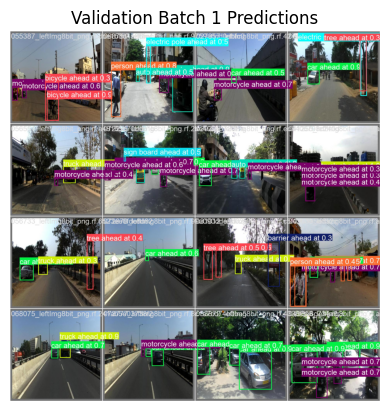

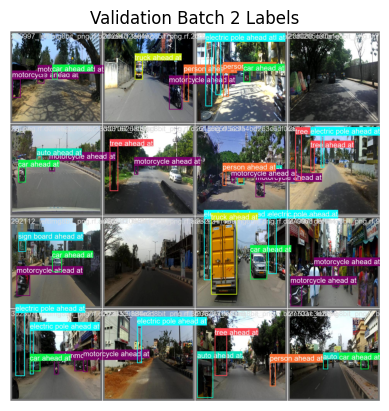

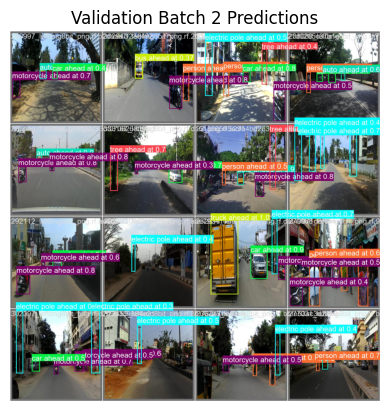

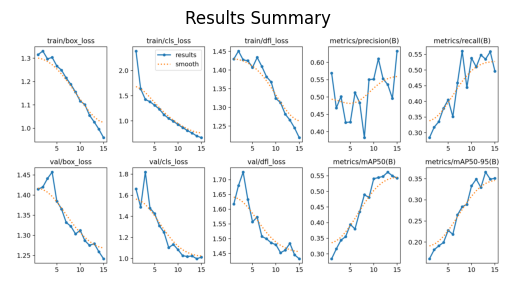

In [20]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Function to display an image
def display_image(image_path, title):
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Displaying the images with titles
image_info = [
    ("/kaggle/working/runs/detect/train/confusion_matrix_normalized.png", "Confusion Matrix (Normalized)"),
    ("/kaggle/working/runs/detect/train/confusion_matrix.png", "Confusion Matrix"),
    ("/kaggle/working/runs/detect/train/F1_curve.png", "F1 Curve"),
    ("/kaggle/working/runs/detect/train/PR_curve.png", "Precision-Recall Curve"),
    ("/kaggle/working/runs/detect/train/P_curve.png", "Precision Curve"),
    ("/kaggle/working/runs/detect/train/R_curve.png", "Recall Curve"),
    ("/kaggle/working/runs/detect/train/val_batch0_labels.jpg", "Validation Batch 0 Labels"),
    ("/kaggle/working/runs/detect/train/val_batch0_pred.jpg", "Validation Batch 0 Predictions"),
    ("/kaggle/working/runs/detect/train/val_batch1_labels.jpg", "Validation Batch 1 Labels"),
    ("/kaggle/working/runs/detect/train/val_batch1_pred.jpg", "Validation Batch 1 Predictions"),
    ("/kaggle/working/runs/detect/train/val_batch2_labels.jpg", "Validation Batch 2 Labels"),
    ("/kaggle/working/runs/detect/train/val_batch2_pred.jpg", "Validation Batch 2 Predictions"),
    ("/kaggle/working/runs/detect/train/results.png", "Results Summary"),
]

for image_path, title in image_info:
    display_image(image_path, title)
